# SPH: colapso e interacción de nubes

En mecánica de medios continuos describimos un material mediante campos como la densidad $\rho(\mathbf r,t)$, la velocidad $\mathbf v(\mathbf r,t)$ y la presión $p(\mathbf r,t)$. Esos campos no son independientes: cada región del medio interactúa con las regiones cercanas y el movimiento modifica continuamente el estado del material.

Para resolver las ecuaciones necesitamos escoger una representación computacional. Una posibilidad es fijar una malla en el espacio. Pero si el medio se deforma mucho, tiene una superficie libre, se fragmenta o sus fronteras cambian, la malla puede dejar de acompañar de manera natural al material.

Esto motiva los métodos lagrangianos basados en representaciones móviles. En particular, **Smoothed Particle Hydrodynamics (SPH)** representa el medio mediante puntos computacionales: cada punto resume el estado del medio en una región local, transporta información y calcula sus propiedades usando las muestras vecinas. No estamos identificando esos puntos con moléculas individuales del fluido.

La pregunta central es:

> ¿Cómo podemos reconstruir densidades, gradientes y fuerzas de un medio continuo a partir de un conjunto móvil de partículas?

## De la dificultad física a la idea de SPH

En una descripción euleriana, observamos el fluido desde posiciones fijas. En una descripción lagrangiana, seguimos representaciones móviles del medio mientras se desplazan. SPH combina esta segunda perspectiva con una interpolación local.

Aquí la palabra **partícula** tiene un significado computacional: no es una molécula individual ni una partícula física aislada del fluido. Es una muestra móvil que representa el estado promedio del medio en una región local alrededor de su posición $\mathbf{r}_a$. En ella guardamos valores como la masa, la velocidad, la densidad y la presión.

Como una muestra no puede conocer por sí sola todo el campo, usamos las muestras vecinas. El parámetro $h$ determina la escala de suavizado: las vecinas cercanas contribuyen mucho, las lejanas contribuyen poco y, para el spline cúbico que usaremos, dejan de contribuir después de $2h$.

Así, el problema continuo se transforma gradualmente en sumas locales sobre representaciones computacionales. Primero veremos cómo se construye esa interpolación y después la usaremos para obtener densidad, presión y aceleración.

<div style="text-align:center">
<img src="source/SPH_particula_representativa.png" alt="Ilustración conceptual de un medio continuo representado por muestras computacionales" width="760">
</div>

## Interacción entre nubes autogravitantes

La motivación anterior es general. Para concretarla estudiaremos dos nubes de gas autogravitantes en 3D: una nube más grande y otra más pequeña que comienza moviéndose hacia ella. En la simulación, las representaciones computacionales del medio interactuarán mediante gravedad, presión y una viscosidad artificial sencilla.

<div style="text-align:center">
<img src="source/SPH_nubes_autogravitantes.png" alt="Dos nubes autogravitantes representadas por muestras computacionales, con velocidad inicial y atracción gravitacional" width="760">
</div>

SPH es un método y un formalismo muy amplio, con distintas ramas y aproximaciones. Este ejemplo no pretende agotarlo; nos permitirá construir y entender algunos conceptos fundamentales: la representación lagrangiana, la reconstrucción de campos mediante un kernel y la aparición de fuerzas a partir de las propiedades locales.

La secuencia será:

$$
\text{medio continuo}
\longrightarrow
\text{kernel local}
\longrightarrow
\text{sumas sobre vecinas}
\longrightarrow
\text{fuerzas}
\longrightarrow
\text{representaciones en movimiento}.
$$

### Fuentes

- [Video introductorio sobre SPH](https://youtu.be/2_dcwBwC0P0)
- [Revisión de Price sobre SPH](https://arxiv.org/abs/astro-ph/0507472)

In [142]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Circle, Patch
from matplotlib.widgets import Slider

plt.rcParams['figure.figsize'] = (7, 4.5)
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.25

## 1. El ejemplo físico: dos nubes que interactúan

Concretemos ahora el escenario. Imaginemos dos nubes de gas aisladas en el espacio. La nube izquierda es más grande y contiene más partículas; la nube derecha es más pequeña y comienza con una velocidad dirigida hacia la primera.

Cada partícula será un **portador de información**: posición, velocidad, masa, densidad y presión. No la interpretaremos como una molécula individual. Es una muestra móvil del medio continuo.

El estado de cada partícula cambia por tres mecanismos:

- **gravedad:** atrae las partículas;
- **presión:** responde a diferencias de densidad y evita que todas se concentren en el mismo punto;
- **viscosidad artificial:** amortigua aproximaciones bruscas y ayuda a estabilizar el cálculo.

Usaremos unidades de código. Por tanto, los números permiten observar la dinámica, pero no representan directamente metros, kilogramos o segundos.

In [143]:
# Parámetros del experimento.
SEMILLA = 12
N_PARTICULAS = 180
MASA_TOTAL = 2.0
MASA_PARTICULA = MASA_TOTAL / N_PARTICULAS

# Parámetros físicos simplificados, en unidades de código.
G = 1.0  # Constante gravitacional.
K_GAS = 0.10  # Constante de la relación presión-densidad.
GAMMA = 5.0 / 3.0  # Exponente de la relación presión-densidad.
ETA = 1.2  # Factor geométrico para estimar h.
EPSILON_GRAVEDAD = 0.10  # Suaviza encuentros gravitacionales.
ALPHA_VISC = 1.0  # Viscosidad lineal.
BETA_VISC = 2.0  # Viscosidad cuadrática.

# Parámetros de integración.
DT = 0.03
N_PASOS = 100

print(f'{N_PARTICULAS} partículas, masa total = {MASA_TOTAL}')
print(f'dt = {DT}, tiempo total = {DT * N_PASOS:.2f}')

180 partículas, masa total = 2.0
dt = 0.03, tiempo total = 3.00


In [144]:
def condiciones_iniciales(n=N_PARTICULAS, semilla=SEMILLA):
    """Construye las muestras iniciales de las dos nubes.

    Para comenzar el experimento necesitamos dos clusters de muestras
    dispersas. La función ubica una nube grande y otra pequeña, y luego
    asigna una velocidad inicial solo a la nube pequeña.
    """
    rng = np.random.default_rng(semilla)

    n_grande = int(0.66 * n)
    n_pequena = n - n_grande

    # loc fija la posición del centro; scale fija la dispersión.
    # size indica cuántas muestras y coordenadas genera cada nube.
    nube_grande = rng.normal(
        loc=(-1.5, 0.0, 0.0),
        scale=0.50,
        size=(n_grande, 3),
    )
    nube_pequena = rng.normal(
        loc=(1.5, 0.0, 0.0),
        scale=0.30,
        size=(n_pequena, 3),
    )
    posiciones = np.vstack((nube_grande, nube_pequena))

    # Al comienzo todas las muestras tienen velocidad cero.
    velocidades = np.zeros_like(posiciones)

    # Después dirigimos la nube pequeña hacia el centro de la grande.
    centro_grande = np.array([-1.5, 0.0, 0.0])
    direccion = centro_grande - posiciones[n_grande:]
    direccion /= np.linalg.norm(direccion, axis=1, keepdims=True)
    velocidades[n_grande:] = 0.5 * direccion

    masas = np.full(n, MASA_TOTAL / n)
    return posiciones, velocidades, masas, n_grande


posiciones_0, velocidades_0, masas, n_grande = condiciones_iniciales()
print(f'nube grande: {n_grande} partículas')
print(f'nube pequeña: {len(posiciones_0) - n_grande} partículas')

nube grande: 118 partículas
nube pequeña: 62 partículas


### ¿Cómo se ve la condición inicial?

Las partículas viven en 3D, pero inicialmente observaremos la proyección $x$-$y$. Esto es solo una forma de visualizar el experimento; el cálculo de distancias y densidades sí usa las tres coordenadas.

### ¿Qué información tiene cada punto?

Esta primera figura solo muestra posiciones. Todavía no hemos calculado densidad, presión ni fuerzas. Es importante separar ambas ideas: una partícula es el lugar donde almacenamos información, mientras que sus propiedades se obtienen después a partir de las vecinas.

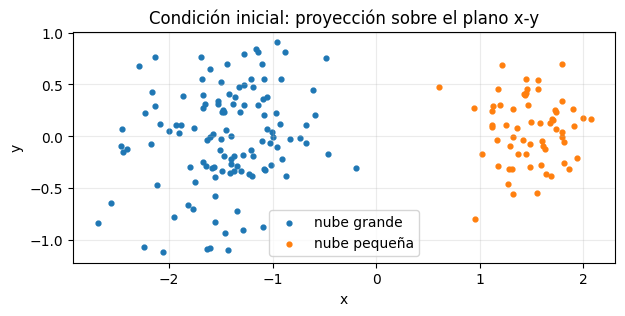

In [145]:
fig, ax = plt.subplots()
ax.scatter(posiciones_0[:n_grande, 0], posiciones_0[:n_grande, 1], s=12, label='nube grande')
ax.scatter(posiciones_0[n_grande:, 0], posiciones_0[n_grande:, 1], s=12, label='nube pequeña')
ax.set_aspect('equal')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title('Condición inicial: proyección sobre el plano x-y')
ax.legend()
plt.show()

## 2. ¿Qué reemplaza a la malla?

En un método de diferencias finitas, una cantidad como $\rho(x,y,z)$ se conoce en nodos de una malla fija. En SPH no hay celdas fijas que contengan el fluido. En cambio, alrededor de una posición $\mathbf r_a$ usamos las muestras computacionales cercanas.

La pregunta es cómo usar la información de esas muestras para estimar una cantidad en $a$. Aquí decir que una muestra **pesa más** no significa que tenga más masa física ni que ejerza por sí sola una fuerza mayor. Significa que tiene una mayor **influencia numérica** en la reconstrucción local: la información de una muestra cercana cuenta más que la de una muestra lejana.

El kernel $W_{ab}$ asigna esa influencia según la distancia entre $a$ y una muestra vecina $b$. En una suma como

$$
A_a \approx \sum_b \frac{m_b}{\rho_b}A_bW_{ab},
$$

$W_{ab}$ modula cuánto contribuye el valor $A_b$ a la estimación en $a$. El factor $m_b/\rho_b$ representa el volumen asociado a la muestra; no es el “peso” del que estamos hablando aquí.

El parámetro $h$ controla la escala de suavizado. En este notebook $W_{ab}=0$ cuando $r_{ab}>2h_a$, así que las muestras fuera de ese radio no contribuyen a la estimación. Más adelante veremos que las fuerzas usan el gradiente del kernel, $\nabla W_{ab}$; el kernel por sí solo asigna influencia para reconstruir campos.

<div style="text-align:center">
<img src="source/SPH_representacion_kernel.png" alt="Reconstrucción local de un campo mediante muestras cercanas y un kernel" width="760">
</div>

### De una identidad a una interpolación

Para cualquier función suave $A(\mathbf r)$, que representa una variable del campo, podemos escribir formalmente

$$
A(\mathbf r)=\int A(\mathbf r')\,\delta(\mathbf r-\mathbf r')\,dV'.
$$

La delta de Dirac selecciona exactamente la posición $\mathbf r$. Es una identidad continua: todavía no nos dice cómo calcular el campo con un número finito de muestras.

SPH reemplaza esa selección puntual por una influencia distribuida en una vecindad:

$$
\delta(\mathbf r-\mathbf r')
\;\longrightarrow\;
W(\mathbf r-\mathbf r',h).
$$

A esta función la llamamos **kernel**. El kernel convierte una distancia en un peso matemático: asigna una influencia grande a posiciones cercanas, una influencia menor a posiciones lejanas y, si tiene soporte compacto, influencia cero fuera de una distancia determinada.

Con este reemplazo obtenemos una aproximación suavizada:

$$
A(\mathbf r)\approx
\int A(\mathbf r')W(\mathbf r-\mathbf r',h)\,dV'.
$$

Para que un campo constante no cambie artificialmente, el kernel debe estar normalizado:

$$
\int W(\mathbf r-\mathbf r',h)\,dV'=1.
$$

La normalización significa que, si $A$ es constante y hay suficientes muestras, la reconstrucción no debería alterar artificialmente su valor.

In [146]:
def kernel_spline(r, h):
    """Kernel de spline cúbico 3D, con soporte r <= 2h."""
    r = np.asarray(r, dtype=float)
    q = r / h
    sigma = 1.0 / (np.pi * h**3)
    W = np.zeros_like(q)

    dentro_1 = (q >= 0) & (q <= 1)
    dentro_2 = (q > 1) & (q <= 2)

    W[dentro_1] = sigma * (1 - 1.5*q[dentro_1]**2 + 0.75*q[dentro_1]**3)
    W[dentro_2] = sigma * 0.25 * (2 - q[dentro_2])**3
    return W


def kernel_gaussiano(r, h):
    """Gaussiano 3D para comparar; no tiene soporte compacto."""
    r = np.asarray(r, dtype=float)
    sigma = 1.0 / (np.pi**1.5 * h**3)
    return sigma * np.exp(-(r / h)**2)

### ¿Por qué no usar siempre una gaussiana?

La gaussiana es intuitiva, pero nunca llega exactamente a cero. En principio, todas las partículas serían vecinas y cada evaluación exigiría revisar todo el conjunto.

El spline cúbico conserva una forma suave cerca del origen, pero corta la interacción en $2h$. El corte no es un detalle gráfico: define qué partículas participan en las sumas discretas.

### Antes de hablar de dinámica

Hasta aquí solo hemos construido una regla de pesos. Todavía no hay gravedad ni movimiento. El siguiente paso es comprobar cómo esa regla permite reconstruir una cantidad a partir de valores que llevan las partículas.

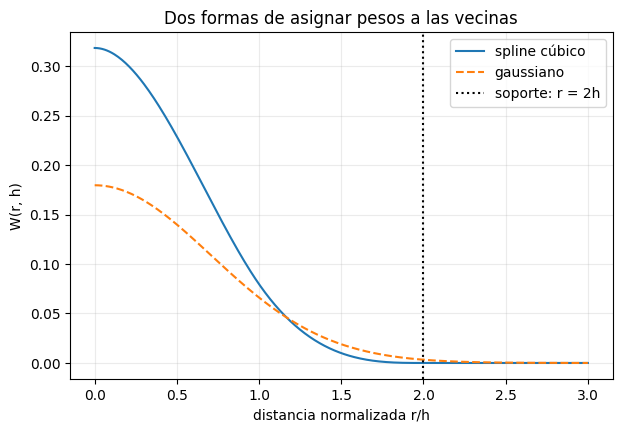

In [147]:
r_grafica = np.linspace(0, 3.0, 400)
h_grafica = 1.0

fig, ax = plt.subplots()
ax.plot(r_grafica / h_grafica, kernel_spline(r_grafica, h_grafica), label='spline cúbico')
ax.plot(r_grafica / h_grafica, kernel_gaussiano(r_grafica, h_grafica), '--', label='gaussiano')
ax.axvline(2, color='black', linestyle=':', label='soporte: r = 2h')
ax.set_xlabel('distancia normalizada r/h')
ax.set_ylabel('W(r, h)')
ax.set_title('Dos formas de asignar pesos a las vecinas')
ax.legend()
plt.show()

In [148]:
# Comprobación numérica de la normalización en 3D.
# En coordenadas esféricas, dV = 4*pi*r^2 dr.
r_integral = np.linspace(0, 2*h_grafica, 2000)
integrando = 4 * np.pi * r_integral**2 * kernel_spline(r_integral, h_grafica)
normalizacion = np.trapz(integrando, r_integral)
print(f'Integral numérica de W en 3D: {normalizacion:.6f}')

Integral numérica de W en 3D: 1.000000


### Reto 1 — explorar el alcance del kernel

Modifica `h_reto` y observa cómo cambia el radio de influencia $2h$. El reto es computacional: debes graficar el kernel y comprobar con una máscara cuáles distancias contribuyen.

Pregunta para interpretar el resultado: si duplicamos $h$, ¿aumenta o disminuye el número de vecinas posibles? ¿Qué ocurre con la resolución espacial?

In [149]:
# Reto: cambia h_reto y completa una gráfica que muestre el soporte.
h_reto = 0.5
r_reto = np.linspace(0, 3*h_reto, 300)
W_reto = kernel_spline(r_reto, h_reto)
print('radio de influencia =', 2*h_reto)

radio de influencia = 1.0


<details>
<summary>Respuesta sugerida del Reto 1</summary>

La parte esencial es seleccionar con una máscara los puntos que están dentro del soporte:

```python
vecinas = r_reto <= 2*h_reto
plt.plot(r_reto[vecinas], W_reto[vecinas])
plt.axvline(2*h_reto, linestyle=':')
```

En el código del kernel esa misma idea aparece en las máscaras `dentro_1` y `dentro_2`. La máscara no mueve partículas: decide qué términos de una suma tienen peso distinto de cero.
</details>

### Una interpolación mínima

Para ver cómo funciona la suma sin introducir todavía un fluido completo, consideremos un cuadrado de lado $L=0.8$. En sus cuatro esquinas colocamos las muestras computacionales $b_1$, $b_2$, $b_3$ y $b_4$. Cada muestra lleva un valor escalar $A_b$.

Ahora elegimos un punto de consulta $a$ dentro del cuadrado. En ese punto no tenemos almacenado un valor de $A$: queremos estimarlo usando los valores de las cuatro muestras. La distancia desde cada esquina hasta $a$ se convierte en un peso mediante el kernel. Por eso una muestra más cercana aporta más a la reconstrucción que una muestra más lejana.

La figura muestra la situación geométrica y la influencia relativa de cada muestra. Después calcularemos la suma y compararemos el valor reconstruido con el valor exacto del campo conocido.
<div style="text-align:center">
<img src="source/SPH_interpolacion_cuadrado.png" alt="Cuadrado con cuatro muestras y un punto de consulta para explicar la interpolación SPH" width="760">
</div>

In [150]:
posiciones_demo = np.array([
    [0.0, 0.0],
    [0.8, 0.0],
    [0.0, 0.8],
    [0.8, 0.8],
])
valores_demo = np.array([1.0, 2.0, 3.0, 4.0])
punto_demo = np.array([0.35, 0.40])
h_demo = 0.70

distancias_demo = np.linalg.norm(posiciones_demo - punto_demo, axis=1)
pesos_demo = kernel_spline(distancias_demo, h_demo)
A_estimado = np.sum(valores_demo * pesos_demo) / np.sum(pesos_demo)

print('distancias:', np.round(distancias_demo, 3))
print('pesos:', np.round(pesos_demo, 3))
print(f'A estimado en el punto de prueba: {A_estimado:.3f}')

distancias: [0.532 0.602 0.532 0.602]
pesos: [0.43  0.341 0.43  0.341]
A estimado en el punto de prueba: 2.442


La división por la suma de pesos convierte la operación en un promedio local para este ejemplo ilustrativo. La formulación SPH que usaremos para la densidad tiene su propia forma, porque incorpora la masa de cada partícula y la relación entre masa y volumen.

## 3. De la integral a una suma de partículas

La integral suavizada todavía es continua. Para obtener una expresión computable dividimos el dominio en pequeñas porciones alrededor de las partículas.

En el entorno de la partícula $b$, el volumen puede expresarse como

$$
dV_b\approx \frac{m_b}{\rho_b}.
$$

Al reemplazar la integral por una suma obtenemos la interpolación SPH:

$$
A_a \equiv A(\mathbf r_a)
\approx
\sum_b \frac{m_b}{\rho_b}A_bW_{ab},
$$

donde

$$
W_{ab}=W(|\mathbf r_a-\mathbf r_b|,h_a).
$$

La suma no usa necesariamente todas las partículas: el spline cúbico elimina las contribuciones con $|\mathbf r_a-\mathbf r_b|>2h_a$.

### El caso especial de la densidad

Para calcular la densidad no tenemos que interpolar un valor $A_b$ independiente. Partimos de la suma general y elegimos $A=\rho$:

$$
\rho_a
\approx
\sum_b \frac{m_b}{\rho_b}\rho_bW_{ab}
=
\sum_b m_bW_{ab}.
$$

La receta computacional es directa: para cada muestra $a$ medimos las distancias a las muestras $b$, convertimos esas distancias en pesos con el kernel y sumamos $m_bW_{ab}$.

En esta versión didáctica calculamos todas las distancias para que la fórmula se vea completa. El kernel ya hace que las contribuciones con $r_{ab}>2h_a$ sean cero. En una implementación optimizada se buscarían solo las vecinas dentro de ese radio; eso reduce el costo, pero no cambia la suma que estamos aprendiendo.

In [151]:
def densidad_sph(posiciones, masas, h):
    """Calcula la densidad local rho_a = sum_b m_b W_ab."""
    rho = np.zeros(len(posiciones))

    for a, posicion_a in enumerate(posiciones):
        # Distancia desde la muestra a hasta todas las muestras b.
        distancias = np.linalg.norm(
            posicion_a - posiciones,
            axis=1,
        )

        # Fuera de 2h[a] el spline devuelve un peso igual a cero.
        pesos = kernel_spline(distancias, h[a])
        rho[a] = np.sum(masas * pesos)

    return rho


h_inicial = np.full(len(posiciones_0), 0.55)
rho_inicial = densidad_sph(posiciones_0, masas, h_inicial)
print('densidad inicial:')
print(f'  mínima = {rho_inicial.min():.4f}')
print(f'  máxima = {rho_inicial.max():.4f}')

densidad inicial:
  mínima = 0.0260
  máxima = 0.5445


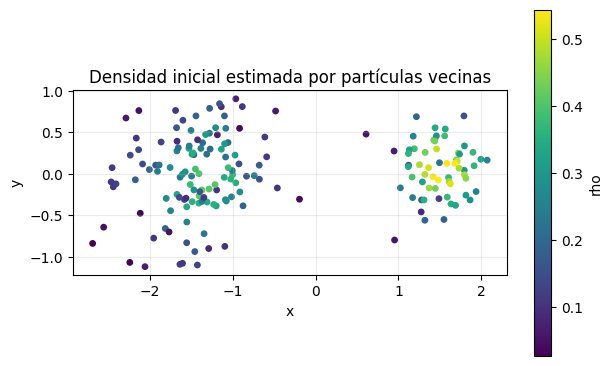

In [152]:
fig, ax = plt.subplots()
imagen = ax.scatter(posiciones_0[:, 0], posiciones_0[:, 1], c=rho_inicial,
                    cmap='viridis', s=15)
ax.set_aspect('equal')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title('Densidad inicial estimada por partículas vecinas')
fig.colorbar(imagen, ax=ax, label='rho')
plt.show()

## 4. Los riesgos de una escala fija

Antes de calcular presión, gradientes y aceleraciones necesitamos asignar una longitud de suavizado $h_a$ a cada muestra. Esa longitud determina hasta qué distancia consultamos vecinas y, por tanto, cuánta información local usamos.

Si usamos el mismo $h$ en todas partes, una región dispersa puede quedarse sin vecinas efectivas, mientras una región concentrada puede consultar demasiadas. Por eso buscamos una escala relacionada con el volumen local:

$$
h_a=\eta\left(\frac{m_a}{\rho_a}\right)^{1/3}.
$$

El cociente $m_a/\rho_a$ representa un volumen característico de la muestra; su raíz cúbica proporciona una longitud característica. Como primera aproximación, usaremos esta relación geométrica para adaptar la escala local.

Aparece una dependencia circular: la densidad depende de $h_a$, pero el valor propuesto para $h_a$ depende de la densidad. Antes de calcular los demás campos, primero debemos estimar $h$ hasta que ambas cantidades sean compatibles. Después usaremos ese $h$ para calcular presión, gradientes y fuerzas.

### Estimar $h$ de forma iterativa

No podemos calcular $h$ una única vez antes de conocer la densidad. Tampoco podemos conocer la densidad final sin elegir $h$. Para una misma configuración de partículas hacemos lo siguiente:

1. Comenzamos con un valor inicial de $h$.
2. Calculamos la densidad usando ese valor.
3. Proponemos un nuevo $h$ a partir de la densidad calculada.
4. Repetimos hasta que el cambio sea pequeño.

La actualización usa una relajación: en cada paso avanzamos solo una fracción hacia el valor propuesto. El ciclo no representa una evolución temporal; es una búsqueda interna del $h$ que usaremos después en los demás campos.

In [153]:
def propiedades_sph(
    posiciones,
    masas,
    h_inicial,
    eta=ETA,
    max_iter=12,
    tol=1e-3,
    relajacion=0.5,
):
    """Estima densidad y suavizado de forma iterativa.

    Antes de calcular presión y fuerzas necesitamos un valor de h
    compatible con la densidad local. La función repite la secuencia
    densidad -> valor propuesto de h -> relajación hasta estabilizarla.
    """
    h = h_inicial.copy()

    for iteracion in range(max_iter):
        rho = densidad_sph(posiciones, masas, h)

        # 1e-12 evita una división por cero si una densidad es muy pequeña.
        h_objetivo = eta * (masas / (rho + 1e-12)) ** (1 / 3)

        # Avanzamos solo una fracción hacia el nuevo valor de h.
        h_nuevo = (1 - relajacion) * h + relajacion * h_objetivo

        # El mismo término protege el denominador del cambio relativo.
        cambio = np.max(np.abs(h_nuevo - h) / (h + 1e-12))
        h = h_nuevo

        if cambio < tol:
            break

    # Recalculamos rho con el h final para que ambos valores correspondan.
    rho = densidad_sph(posiciones, masas, h)
    return rho, h, iteracion + 1, cambio


rho_0, h_0, iteraciones_h, cambio_h = propiedades_sph(
    posiciones_0,
    masas,
    h_inicial,
)
print(f'iteraciones para hacer consistente h: {iteraciones_h}')
print(f'cambio relativo final: {cambio_h:.2e}')
if cambio_h < 1e-3:
    print('criterio de cambio relativo alcanzado')
else:
    print('se alcanzó el máximo de iteraciones; usamos el último valor calculado')
print(f'h mínimo/máximo: {h_0.min():.3f} / {h_0.max():.3f}')

iteraciones para hacer consistente h: 12
cambio relativo final: 9.54e-03
se alcanzó el máximo de iteraciones; usamos el último valor calculado
h mínimo/máximo: 0.238 / 1.119


### Una escala fija puede dejar muestras aisladas

Para hacer visible el problema, elegimos dos muestras de la nube pequeña y usamos el mismo $h$ para ambas: una está muy alejada del centro de su nube y la otra está cerca del centro. Contamos las vecinas efectivas dentro del radio $2h$. El conteo no incluye la propia muestra.

El cero no es un error: significa que, con esa escala fija, ninguna otra muestra cae dentro de la vecindad. A la derecha repetimos el conteo usando el $h$ adaptativo calculado antes. La meta no es que todos los conteos sean idénticos, sino evitar muestras aisladas y ajustar la escala a la concentración local. Aunque dibujamos la proyección $x$-$y$, las distancias se calculan en las tres coordenadas.

In [ ]:
# Elegimos una muestra periférica y otra central de la nube pequeña.
centro_nube_pequena = posiciones_0[n_grande:].mean(axis=0)
distancias_al_centro = np.linalg.norm(
    posiciones_0[n_grande:] - centro_nube_pequena,
    axis=1,
)
indice_periferico = n_grande + np.argmax(distancias_al_centro)
indice_central = n_grande + np.argmin(distancias_al_centro)
indices_prueba = [indice_periferico, indice_central]
nombres = ['periférica', 'central']
colores = ['tab:orange', 'tab:blue']

# Una misma escala para las dos muestras.
h_fijo = 0.20
vecinos_fijos = []
for indice in indices_prueba:
    distancias = np.linalg.norm(
        posiciones_0 - posiciones_0[indice],
        axis=1,
    )
    numero_vecinos = np.sum(distancias <= 2 * h_fijo) - 1
    vecinos_fijos.append(int(numero_vecinos))

# Con h adaptativo, cada muestra usa su propio radio de soporte 2h.
vecinos_adaptativos = []
for indice in indices_prueba:
    distancias = np.linalg.norm(
        posiciones_0 - posiciones_0[indice],
        axis=1,
    )
    numero_vecinos = np.sum(
        distancias <= 2 * h_0[indice]
    ) - 1
    vecinos_adaptativos.append(int(numero_vecinos))


# Los conteos quedan listos para compararlos en las figuras siguientes.


In [ ]:
# Ahora dibujamos el soporte alrededor de las muestras elegidas.

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Izquierda: mostramos que el soporte es el radio 2h alrededor de a.
ax = axes[0]
ax.scatter(
    posiciones_0[:, 0],
    posiciones_0[:, 1],
    s=10,
    color='0.65',
)
for indice, nombre, color, n_fijo, n_adaptativo in zip(
    indices_prueba,
    nombres,
    colores,
    vecinos_fijos,
    vecinos_adaptativos,
):
    x, y = posiciones_0[indice, :2]
    ax.scatter(
        x,
        y,
        s=60,
        color=color,
        edgecolor='black',
        zorder=3,
    )

    # Línea discontinua: el radio 2h cuando h es fijo.
    ax.add_patch(
        Circle(
            (x, y),
            2 * h_fijo,
            fill=False,
            color=color,
            linestyle='--',
            linewidth=2,
        )
    )
    # Línea continua: el radio 2h que resulta de adaptar h localmente.
    ax.add_patch(
        Circle(
            (x, y),
            2 * h_0[indice],
            fill=False,
            color=color,
            linestyle='-',
            linewidth=1.5,
            alpha=0.75,
        )
    )
    ax.annotate(
        f'{nombre}\nN fijo={n_fijo}; N adaptativo={n_adaptativo}',
        xy=(x, y),
        xytext=(8, 8),
        textcoords='offset points',
        color=color,
        fontsize=8,
    )

ax.set_title('El soporte es el radio de consulta $2h$')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_aspect('equal')
ax.legend(
    handles=[
        Line2D(
            [0], [0], color='0.25', linestyle='--',
            label='soporte con h fijo',
        ),
        Line2D(
            [0], [0], color='0.25', linestyle='-',
            label='soporte con h adaptativo',
        ),
    ],
    loc='upper left',
    fontsize=8,
)
ax.text(
    0.03,
    0.03,
    'Dentro de 2h contamos las vecinas efectivas',
    transform=ax.transAxes,
    fontsize=8,
    bbox=dict(facecolor='white', alpha=0.85),
)



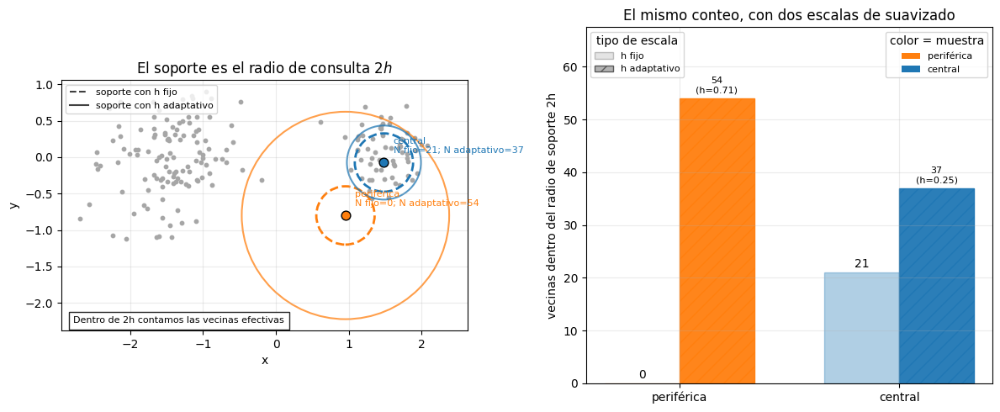

vecinas con h fijo:        [0, 21]
vecinas con h adaptativo: [54, 37]


In [154]:
# Finalmente comparamos cuántas vecinas aporta cada escala.

# Derecha: el color identifica la muestra; el patrón identifica el tipo de h.
ax = axes[1]
posiciones_barras = np.arange(len(indices_prueba))
ancho = 0.34
barras_fijas = ax.bar(
    posiciones_barras - ancho / 2,
    vecinos_fijos,
    ancho,
    color=colores,
    alpha=0.35,
    edgecolor=colores,
)
barras_adaptativas = ax.bar(
    posiciones_barras + ancho / 2,
    vecinos_adaptativos,
    ancho,
    color=colores,
    alpha=0.95,
    hatch='//',
    edgecolor=colores,
)

for barra, valor in zip(barras_fijas, vecinos_fijos):
    ax.text(
        barra.get_x() + barra.get_width() / 2,
        valor + 1,
        str(valor),
        ha='center',
    )
for barra, valor, indice in zip(
    barras_adaptativas,
    vecinos_adaptativos,
    indices_prueba,
):
    ax.text(
        barra.get_x() + barra.get_width() / 2,
        valor + 1,
        f'{valor}\n(h={h_0[indice]:.2f})',
        ha='center',
        fontsize=8,
    )

ax.set_xticks(posiciones_barras)
ax.set_xticklabels(nombres)
ax.set_ylabel('vecinas dentro del radio de soporte 2h')
ax.set_title('El mismo conteo, con dos escalas de suavizado')
ax.set_ylim(0, 1.25 * max(vecinos_adaptativos))

leyenda_tipo = ax.legend(
    handles=[
        Patch(
            facecolor='0.7',
            edgecolor='0.35',
            alpha=0.35,
            label='h fijo',
        ),
        Patch(
            facecolor='0.7',
            edgecolor='0.35',
            hatch='//',
            label='h adaptativo',
        ),
    ],
    title='tipo de escala',
    loc='upper left',
    fontsize=8,
)
ax.add_artist(leyenda_tipo)
ax.legend(
    handles=[
        Patch(facecolor=colores[0], label='periférica'),
        Patch(facecolor=colores[1], label='central'),
    ],
    title='color = muestra',
    loc='upper right',
    fontsize=8,
)

plt.tight_layout()
plt.show()

print('vecinas con h fijo:       ', vecinos_fijos)
print('vecinas con h adaptativo:', vecinos_adaptativos)

### Explorar la relajación

La relajación decide qué fracción del cambio aplicamos en cada paso:

$$
h_a^{(k+1)}=(1-\lambda)h_a^{(k)}
+\lambda h_{a,\mathrm{objetivo}}^{(k)}.
$$

Con un valor pequeño de $\lambda$ los cambios son suaves, pero pueden requerir más iteraciones. Con un valor grande avanzamos más rápido hacia el valor propuesto. El slider permite observar esa diferencia para la misma configuración inicial.

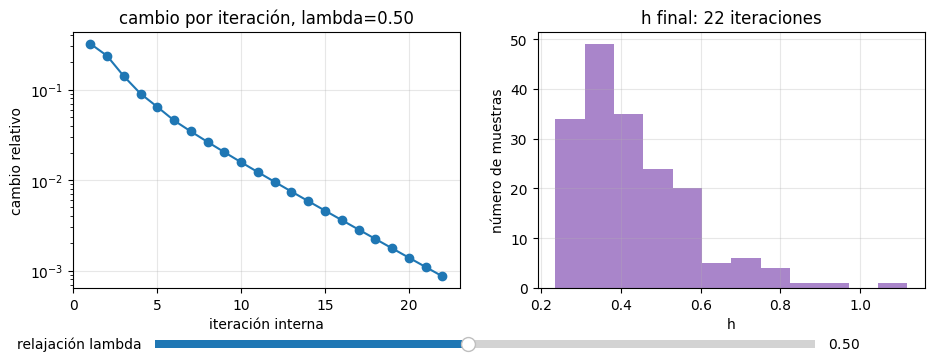

In [155]:
def historia_relajacion(relajacion, max_iter=30, tolerancia=1e-3):
    """Guarda cómo cambia h durante la estimación iterativa."""
    h = h_inicial.copy()
    cambios = []

    for _ in range(max_iter):
        rho = densidad_sph(posiciones_0, masas, h)

        # El término pequeño evita dividir por cero.
        h_objetivo = ETA * (masas / (rho + 1e-12)) ** (1 / 3)
        h_nuevo = (1 - relajacion) * h + relajacion * h_objetivo
        cambio = np.max(np.abs(h_nuevo - h) / (h + 1e-12))
        cambios.append(cambio)
        h = h_nuevo

        if cambio < tolerancia:
            break

    return np.array(cambios), h


fig, axes = plt.subplots(1, 2, figsize=(11, 4))
plt.subplots_adjust(bottom=0.24)


def dibujar_relajacion(valor):
    """Actualiza la convergencia y la distribución final de h."""
    relajacion = float(valor)
    cambios, h_final = historia_relajacion(relajacion)

    axes[0].clear()
    axes[0].semilogy(
        np.arange(1, len(cambios) + 1),
        np.maximum(cambios, 1e-12),
        marker='o',
    )
    axes[0].set_title(
        f'cambio por iteración, lambda={relajacion:.2f}'
    )
    axes[0].set_xlabel('iteración interna')
    axes[0].set_ylabel('cambio relativo')
    axes[0].grid(True, alpha=0.3)

    axes[1].clear()
    axes[1].hist(h_final, bins=12, color='tab:purple', alpha=0.8)
    axes[1].set_title(f'h final: {len(cambios)} iteraciones')
    axes[1].set_xlabel('h')
    axes[1].set_ylabel('número de muestras')

    for axis in axes:
        axis.grid(True, alpha=0.3)

    fig.canvas.draw_idle()


dibujar_relajacion(0.5)
eje_slider = plt.axes([0.20, 0.08, 0.60, 0.04])
slider_relajacion = Slider(
    eje_slider,
    'relajación lambda',
    0.05,
    1.0,
    valinit=0.5,
    valstep=0.05,
)


def actualizar_relajacion(valor):
    """Redibuja la figura cuando cambia el slider."""
    dibujar_relajacion(valor)


slider_relajacion.on_changed(actualizar_relajacion)
plt.show()

## 5. ¿Y los gradientes?

Hasta ahora hemos calculado densidad, escala de suavizado y presión. Para saber cómo cambian las velocidades debemos volver a la ecuación física que gobierna el movimiento: Navier--Stokes.

Para un fluido newtoniano podemos escribir su ecuación de cantidad de movimiento como

$$
\rho\frac{D\mathbf v}{Dt}
=
-\nabla p
+\rho\mathbf g
+\nabla\cdot\boldsymbol{\tau}.
$$

Cada término tiene un papel distinto:

- $D\mathbf v/Dt$ es la aceleración que experimenta una muestra que se mueve con el fluido;
- $-\nabla p$ es la fuerza debida a diferencias de presión;
- $\rho\mathbf g$ representa fuerzas de cuerpo, como la gravedad;
- $\nabla\cdot\boldsymbol{\tau}$ representa las fuerzas viscosas asociadas a los esfuerzos internos.

Al dividir por la densidad obtenemos la forma de aceleración:

$$
\frac{D\mathbf v}{Dt}
=
-\frac{1}{\rho}\nabla p
+\mathbf g
+\frac{1}{\rho}\nabla\cdot\boldsymbol{\tau}.
$$

Esta ecuación explica la estructura del código. Para la nube autogravitante calcularemos $\mathbf g$ como una suma gravitacional de tipo $N$ cuerpos. Para la presión necesitamos aproximar $\nabla p$ a partir de las muestras. Y, en lugar de resolver aquí todos los esfuerzos viscosos, añadiremos una viscosidad artificial sencilla que ayuda a estabilizar la discretización.

Por tanto, la aceleración computacional se organiza como

$$
\mathbf a_a
=
\underbrace{\mathbf a_a^{(p)}}_{\text{presión}}
+
\underbrace{\mathbf a_a^{(g)}}_{\text{gravedad}}
+
\underbrace{\mathbf a_a^{(\mathrm{visc})}}_{\text{viscosidad artificial}}.
$$

El gradiente aparece porque la presión no empuja por su valor aislado: una presión uniforme no produce aceleración. Necesitamos conocer cómo cambia espacialmente. Para obtener esa variación con partículas, retomamos la interpolación SPH de un campo suave $A(\mathbf r)$:

$$
A_a\approx\sum_b\frac{m_b}{\rho_b}A_bW_{ab}.
$$

Al derivar respecto a la posición de $a$, la derivada actúa sobre el kernel:

$$
\nabla_a A_a
\approx
\sum_b\frac{m_b}{\rho_b}A_b\nabla_aW_{ab}.
$$

Esta es la suma que necesitamos para construir gradientes de campos. No es todavía una aceleración: se convierte en aceleración cuando la aplicamos al término $-\nabla p/\rho$ de Navier--Stokes.

### Una pareja a la vez: qué calcula el siguiente código

La función siguiente no suma todavía todas las vecinas. Recibe el vector $\mathbf r_{ab}=\mathbf r_a-\mathbf r_b$ de una pareja y devuelve $\nabla_aW_{ab}$, es decir, la dirección y la intensidad con que el kernel cambia cuando movemos la muestra $a$.

La suma aparece en las funciones de presión y viscosidad: allí recorremos las parejas, calculamos esta contribución local y la acumulamos en la aceleración. La gravedad no pasa por esta función.

In [156]:
def gradiente_kernel(vector_ab, h):
    """Devuelve gradiente de W_ab respecto a la posición de a.

    La función resuelve la contribución de una sola pareja. Las
    funciones de presión y viscosidad suman después las parejas.
    """
    distancia = np.linalg.norm(vector_ab)
    if distancia == 0 or distancia >= 2 * h:
        return np.zeros(3)

    q = distancia / h
    if q <= 1:
        derivada_q = -3 * q + 2.25 * q**2
    else:
        derivada_q = -0.75 * (2 - q)**2

    # W = f(q) / (pi*h^3), y dW/dr = f'(q) / (pi*h^4).
    dW_dr = derivada_q / (np.pi * h**4)
    direccion = vector_ab / distancia
    return dW_dr * direccion

### De la ecuación de movimiento a la aceleración de presión

La sección anterior nos dio una receta para aproximar gradientes. Ahora la aplicamos al término de presión de la ecuación de movimiento:

$$
\left.\frac{d\mathbf v_a}{dt}\right|_p
=-\frac{1}{\rho_a}\nabla p_a.
$$

Una sustitución directa del gradiente sería posible, pero no trataría de la misma manera a $a$ y a $b$. Para que cada interacción interna aparezca como un par de fuerzas opuestas, usamos una forma simétrica:

$$
\mathbf F_{ab}^{(p)}
=-m_am_b\left(
\frac{p_a}{\rho_a^2}\nabla_aW_{ab}(h_a)
+
\frac{p_b}{\rho_b^2}\nabla_aW_{ab}(h_b)
\right).
$$

La aceleración de $a$ se obtiene dividiendo la fuerza de cada pareja por $m_a$ y sumando todas las vecinas:

$$
\left.\frac{d\mathbf v_a}{dt}\right|_p
=-\sum_bm_b\left(
\frac{p_a}{\rho_a^2}\nabla_aW_{ab}(h_a)
+
\frac{p_b}{\rho_b^2}\nabla_aW_{ab}(h_b)
\right).
$$

Por eso la suma ya no es mágica: la función del kernel calcula el gradiente de una pareja y el doble bucle suma esas contribuciones. Además, el código añade a $b$ la contribución opuesta. Esta es únicamente la aceleración de presión; todavía no incluye la gravedad ni la viscosidad.

Para cerrar el cálculo necesitamos una relación entre presión y densidad. El experimento usa una ley politrópica sencilla:

$$
p_a=K\rho_a^\gamma.
$$

No estamos resolviendo aquí la ecuación de energía; por eso esta relación funciona como una ecuación de estado prescrita.

### Ilustración: de las propiedades locales a una fuerza por pares

<div style="text-align:center">
<img src="source/SPH_interaccion_presion.png" alt="De la vecindad local a la densidad, la presión y la fuerza por pares en SPH" width="760">
</div>

**Figura.** Las vecinas contribuyen a una propiedad local, la densidad se transforma en presión y el gradiente del kernel comunica esa presión como una fuerza por pares.

In [157]:
def ecuacion_de_estado(rho, K=K_GAS, gamma=GAMMA):
    """Convierte densidad en presión mediante la ley politrópica."""
    return K * rho**gamma


def aceleracion_presion(posiciones, masas, rho, h, presion):
    """Suma la aceleración de presión y conserva pares opuestos.

    Para cada pareja calcula los dos gradientes del kernel que aparecen
    en la expresión simétrica y acumula la fuerza en ambas muestras.
    Esta función no calcula gravedad ni viscosidad.
    """
    aceleracion = np.zeros_like(posiciones)
    n = len(posiciones)

    for a in range(n):
        for b in range(a + 1, n):
            vector_ab = posiciones[a] - posiciones[b]
            distancia = np.linalg.norm(vector_ab)
            radio_soporte = 2 * max(h[a], h[b])
            if distancia == 0 or distancia >= radio_soporte:
                continue

            # Cada llamada calcula el gradiente de una pareja.
            grad_a = gradiente_kernel(vector_ab, h[a])
            grad_b = gradiente_kernel(vector_ab, h[b])
            termino = (
                presion[a] / rho[a]**2 * grad_a
                + presion[b] / rho[b]**2 * grad_b
            )

            # Acción y reacción: la pareja recibe fuerzas opuestas.
            aceleracion[a] += -masas[b] * termino
            aceleracion[b] += masas[a] * termino

    return aceleracion


presion_0 = ecuacion_de_estado(rho_0)
aceleracion_p_0 = aceleracion_presion(
    posiciones_0,
    masas,
    rho_0,
    h_0,
    presion_0,
)
print(f'presión mínima/máxima: '
      f'{presion_0.min():.4e} / {presion_0.max():.4e}')
print(f'máxima aceleración de presión: '
      f'{np.linalg.norm(aceleracion_p_0, axis=1).max():.4e}')

presión mínima/máxima: 7.8481e-05 / 1.8788e-01
máxima aceleración de presión: 6.8567e-01


## 6. Una aceleración que no necesita gradientes: gravedad

La gravedad es la contribución que más claramente se parece a un problema de $N$ cuerpos. Para cada muestra $a$ sumamos la atracción de todas las demás muestras $b$:

$$
\mathbf a_a^{(g)}
=-G\sum_{b\ne a}m_b
\frac{\mathbf r_a-\mathbf r_b}
{\left(|\mathbf r_a-\mathbf r_b|^2+\epsilon^2\right)^{3/2}}.
$$

Aquí no reconstruimos presión, densidad ni un campo mediante el kernel. Tampoco usamos $h$. La dirección de cada contribución sale directamente de la separación entre las dos posiciones.

El parámetro $\epsilon$ evita que una distancia muy pequeña produzca una aceleración numéricamente enorme. Este suavizado gravitacional no es el mismo $h$ del kernel: $h$ controla la interpolación hidrodinámica y $\epsilon$ regulariza la interacción gravitacional.

La suma no necesita una malla. En este notebook la calculamos directamente para que la idea sea visible; en códigos grandes se usan algoritmos de vecindad o árboles para reducir el costo.

In [158]:
def aceleracion_gravedad(posiciones, masas, G=G, epsilon=EPSILON_GRAVEDAD):
    """Calcula la aceleración gravitacional directa de tipo N cuerpos."""
    aceleracion = np.zeros_like(posiciones)

    for a in range(len(posiciones)):
        # Vector desde cada b hacia a; no interviene ningún kernel.
        vector_ab = posiciones[a] - posiciones
        distancia2 = np.sum(vector_ab**2, axis=1) + epsilon**2
        distancia2[a] = np.inf  # una muestra no se atrae a sí misma
        contribuciones = (
            masas[:, None] * vector_ab / distancia2[:, None]**1.5
        )
        aceleracion[a] = -G * np.sum(contribuciones, axis=0)

    return aceleracion


aceleracion_g_0 = aceleracion_gravedad(posiciones_0, masas)
print(f'máxima aceleración gravitacional inicial: '
      f'{np.linalg.norm(aceleracion_g_0, axis=1).max():.4e}')

máxima aceleración gravitacional inicial: 2.0114e+00


## 7. Viscosidad artificial: un término numérico con interpretación física

Las ecuaciones continuas pueden tener soluciones con cambios muy bruscos. En una discretización de partículas, esos cambios pueden producir oscilaciones o partículas que se atraviesan.

Por eso añadimos un término de **viscosidad artificial** solamente cuando dos partículas se acercan:

$$
(\mathbf r_a-\mathbf r_b)\cdot(\mathbf v_a-\mathbf v_b)<0.
$$

Una forma simplificada del término usa

$$
\mu_{ab}=\frac{h_{ab}\,\mathbf r_{ab}\cdot\mathbf v_{ab}}
{|\mathbf r_{ab}|^2+0.01h_{ab}^2},
$$

$$
\Pi_{ab}=\frac{-\alpha c_{ab}\mu_{ab}+\beta\mu_{ab}^2}{\rho_{ab}}.
$$

Aquí $c_{ab}$ es una velocidad de sonido estimada a partir de la ecuación de estado. Este término **no es una medición directa de la viscosidad molecular**: es una estabilización numérica inspirada en la física de choques y compresiones.

In [159]:
def aceleracion_viscosidad(posiciones, velocidades, masas, rho, h, presion,
                           alpha=ALPHA_VISC, beta=BETA_VISC):
    """Viscosidad artificial cuando las partículas se aproximan."""
    aceleracion = np.zeros_like(posiciones)
    sonido = np.sqrt(GAMMA * presion / (rho + 1e-12))
    n = len(posiciones)

    for a in range(n):
        for b in range(a + 1, n):
            vector_ab = posiciones[a] - posiciones[b]
            distancia = np.linalg.norm(vector_ab)
            if distancia == 0 or distancia >= 2*max(h[a], h[b]):
                continue

            velocidad_ab = velocidades[a] - velocidades[b]
            acercamiento = np.dot(vector_ab, velocidad_ab)
            if acercamiento >= 0:
                continue

            h_ab = 0.5*(h[a] + h[b])
            rho_ab = 0.5*(rho[a] + rho[b])
            c_ab = 0.5*(sonido[a] + sonido[b])
            mu_ab = h_ab * acercamiento / (distancia**2 + 0.01*h_ab**2)
            Pi_ab = (-alpha*c_ab*mu_ab + beta*mu_ab**2) / rho_ab

            grad_promedio = 0.5*(gradiente_kernel(vector_ab, h[a]) +
                                 gradiente_kernel(vector_ab, h[b]))
            aceleracion[a] += -masas[b] * Pi_ab * grad_promedio
            aceleracion[b] +=  masas[a] * Pi_ab * grad_promedio

    return aceleracion

## 8. Integrar el movimiento

Ya podemos reunir las aceleraciones, que tienen orígenes distintos:

$$
\mathbf a_a
=\underbrace{\mathbf a_a^{(g)}}_{\text{N cuerpos}}
+\underbrace{\mathbf a_a^{(p)}}_{\text{gradiente de presión}}
+\underbrace{\mathbf a_a^{(\mathrm{visc})}}_{\text{estabilización por pares}}.
$$

La gravedad se calcula directamente con las posiciones. La presión necesita densidad, presión y gradientes del kernel. La viscosidad artificial usa velocidades relativas y el gradiente del kernel para orientar su contribución. No son tres maneras de calcular la misma aceleración: son tres términos que el modelo suma al final.

El paso temporal usa una forma sencilla de Leapfrog:

1. actualizar la velocidad medio paso;
2. mover la posición un paso completo;
3. recalcular densidad, $h$, presión y aceleraciones;
4. completar la actualización de la velocidad.

La simulación no busca un estado estático. Las partículas se mueven y el campo se vuelve a calcular después de cada movimiento. Por eso el número de pasos es una decisión numérica, mientras que la trayectoria y las fuerzas son el resultado del modelo.

In [160]:
def aceleracion_total(posiciones, velocidades, masas, rho, h, presion,
                      usar_gravedad=True, usar_presion=True,
                      usar_viscosidad=True, alpha=ALPHA_VISC, beta=BETA_VISC):
    """Combina los términos de aceleración del modelo.

    Reúne gravedad, presión y viscosidad para obtener la aceleración
    que se usa en el siguiente paso de integración.
    """
    total = np.zeros_like(posiciones)

    if usar_gravedad:
        total += aceleracion_gravedad(posiciones, masas)
    if usar_presion:
        total += aceleracion_presion(posiciones, masas, rho, h, presion)
    if usar_viscosidad:
        total += aceleracion_viscosidad(
            posiciones, velocidades, masas, rho, h, presion,
            alpha=alpha, beta=beta
        )

    return total

### Preparar un estado antes de mover partículas

Primero calculamos las propiedades de una configuración fija. Todavía no hay un bucle temporal: solo construimos el estado inicial que necesita la ecuación de movimiento.

In [161]:
def preparar_estado(posiciones_iniciales, velocidades_iniciales, masas,
                    usar_gravedad=True, usar_presion=True,
                    usar_viscosidad=True, alpha=ALPHA_VISC, beta=BETA_VISC):
    """Construye el estado inicial antes de integrar.

    Calcula densidad, h, presión y aceleración para que el primer paso
    temporal tenga toda la información necesaria.
    """
    posiciones = posiciones_iniciales.copy()
    velocidades = velocidades_iniciales.copy()
    h = np.full(len(posiciones), 0.55)

    rho, h, _, _ = propiedades_sph(posiciones, masas, h)
    presion = ecuacion_de_estado(rho)
    aceleracion = aceleracion_total(
        posiciones, velocidades, masas, rho, h, presion,
        usar_gravedad, usar_presion, usar_viscosidad, alpha, beta
    )
    return {
        'posiciones': posiciones,
        'velocidades': velocidades,
        'rho': rho,
        'presion': presion,
        'h': h,
        'aceleracion': aceleracion,
    }

### Un solo paso temporal

El paso Leapfrog puede leerse como una secuencia física:

1. la aceleración modifica parcialmente la velocidad;
2. esa velocidad mueve las partículas;
3. al cambiar las posiciones, cambian las vecinas y las propiedades;
4. recalculamos la aceleración y completamos la velocidad.

Separar este paso del bucle permite ver qué se repite y qué representa realmente el tiempo.

In [162]:
def avanzar_un_paso(estado, masas, dt=DT,
                    usar_gravedad=True, usar_presion=True,
                    usar_viscosidad=True, alpha=ALPHA_VISC, beta=BETA_VISC):
    """Avanza las partículas un paso y actualiza sus propiedades.

    Aplica la secuencia Leapfrog: medio paso de velocidad, movimiento,
    recalculo de campos y segundo medio paso de velocidad.
    """
    posiciones = estado['posiciones'].copy()
    velocidades = estado['velocidades'].copy()
    aceleracion = estado['aceleracion']

    velocidades += 0.5 * dt * aceleracion
    posiciones += dt * velocidades

    rho, h, _, _ = propiedades_sph(posiciones, masas, estado['h'])
    presion = ecuacion_de_estado(rho)
    aceleracion = aceleracion_total(
        posiciones, velocidades, masas, rho, h, presion,
        usar_gravedad, usar_presion, usar_viscosidad, alpha, beta
    )
    velocidades += 0.5 * dt * aceleracion

    return {
        'posiciones': posiciones,
        'velocidades': velocidades,
        'rho': rho,
        'presion': presion,
        'h': h,
        'aceleracion': aceleracion,
    }

In [163]:
estado_demo = preparar_estado(posiciones_0, velocidades_0, masas)
estado_demo_1 = avanzar_un_paso(estado_demo, masas)
desplazamiento_demo = np.linalg.norm(
    estado_demo_1['posiciones'] - estado_demo['posiciones'], axis=1
)
print(f'desplazamiento máximo en un paso: {desplazamiento_demo.max():.3e}')

desplazamiento máximo en un paso: 1.569e-02


### Repetir el paso y guardar la historia

Ahora sí construimos la simulación. El bucle no contiene nuevas ecuaciones: llama al paso temporal, guarda las cantidades que queremos visualizar y comprueba el progreso.

In [164]:
def simular(posiciones_iniciales, velocidades_iniciales, masas,
            dt=DT, n_pasos=N_PASOS, mostrar_progreso=True,
            usar_gravedad=True, usar_presion=True, usar_viscosidad=True,
            alpha=ALPHA_VISC, beta=BETA_VISC):
    """Integra el sistema y guarda los campos de cada instante.

    Separa el bucle temporal de la visualización para poder inspeccionar
    después posiciones, velocidades, densidad, presión y h.
    """
    estado = preparar_estado(
        posiciones_iniciales, velocidades_iniciales, masas,
        usar_gravedad, usar_presion, usar_viscosidad, alpha, beta
    )

    nombres = ['posiciones', 'velocidades', 'rho', 'presion', 'h']
    historia = {nombre: [estado[nombre].copy()] for nombre in nombres}
    historia['tiempo'] = [0.0]

    for paso in range(n_pasos):
        estado = avanzar_un_paso(
            estado, masas, dt,
            usar_gravedad, usar_presion, usar_viscosidad, alpha, beta
        )
        for nombre in nombres:
            historia[nombre].append(estado[nombre].copy())
        historia['tiempo'].append((paso + 1) * dt)

        if mostrar_progreso and (paso + 1) % 20 == 0:
            print(f'paso {paso + 1:3d}/{n_pasos}')

    for nombre in historia:
        historia[nombre] = np.array(historia[nombre])
    return historia

## 9. Experimento final: dos nubes que interactúan

Ejecutamos ahora la misma idea física que motivó el notebook original, con un número de partículas que permite leer y ejecutar el cálculo durante una clase.

Observaremos:

- si la nube pequeña se acerca a la grande;
- cómo cambia la distribución de partículas;
- dónde aparecen mayores densidades y presiones;
- cómo las velocidades reflejan la interacción.

In [165]:
historia = simular(posiciones_0, velocidades_0, masas)

print('simulación terminada')
print('masa total (constante):', masas.sum())
print('frames guardados:', len(historia['tiempo']))
print('densidad final mínima/máxima:',
      historia['rho'][-1].min(), historia['rho'][-1].max())

paso  20/100
paso  40/100
paso  60/100
paso  80/100
paso 100/100
simulación terminada
masa total (constante): 2.0
frames guardados: 101
densidad final mínima/máxima: 0.0007389697450804998 37.90485621705912


### Leer el estado final

En SPH no debemos buscar una cuadrícula coloreada sobre la cual el fluido “vive”. El soporte de la solución son las posiciones de las partículas. Los colores muestran propiedades asociadas a esas posiciones.

La primera fila compara la configuración inicial con la final. La segunda muestra campos de la última instantánea. Las flechas de velocidad se dibujan solo para una muestra de partículas para no ocultar la nube.

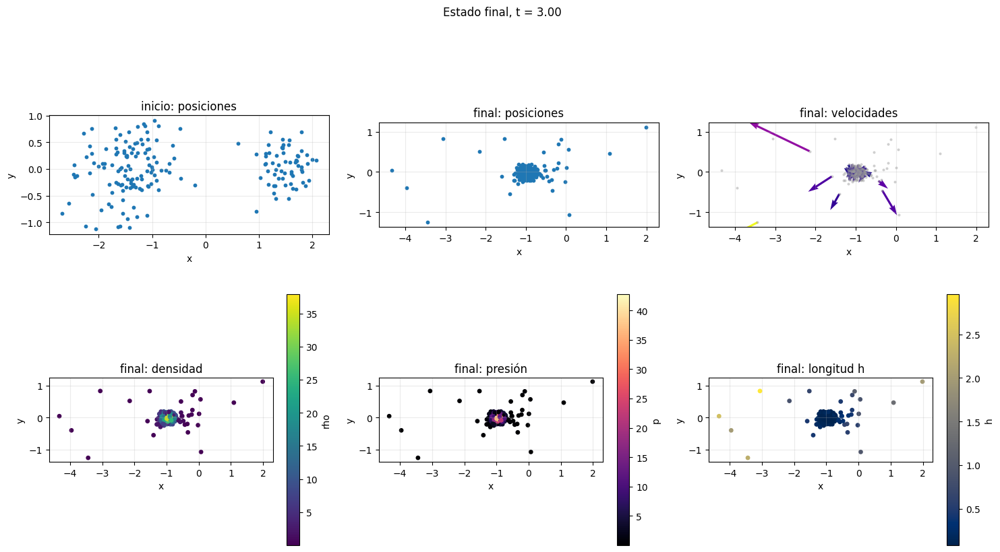

In [166]:
pos_final = historia['posiciones'][-1]
vel_final = historia['velocidades'][-1]
rho_final = historia['rho'][-1]
presion_final = historia['presion'][-1]
h_final = historia['h'][-1]
velocidad_final = np.linalg.norm(vel_final, axis=1)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

axes[0, 0].scatter(posiciones_0[:, 0], posiciones_0[:, 1], s=10)
axes[0, 0].set_title('inicio: posiciones')

axes[0, 1].scatter(pos_final[:, 0], pos_final[:, 1], s=10, c='tab:blue')
axes[0, 1].set_title('final: posiciones')

muestra = np.arange(0, len(pos_final), max(1, len(pos_final)//45))
axes[0, 2].quiver(pos_final[muestra, 0], pos_final[muestra, 1],
                  vel_final[muestra, 0], vel_final[muestra, 1],
                  velocidad_final[muestra], cmap='plasma', scale=12)
axes[0, 2].scatter(pos_final[:, 0], pos_final[:, 1], s=4, color='0.6', alpha=0.35)
axes[0, 2].set_title('final: velocidades')

im_rho = axes[1, 0].scatter(pos_final[:, 0], pos_final[:, 1], s=15, c=rho_final, cmap='viridis')
axes[1, 0].set_title('final: densidad')
fig.colorbar(im_rho, ax=axes[1, 0], label='rho')

im_p = axes[1, 1].scatter(pos_final[:, 0], pos_final[:, 1], s=15, c=presion_final, cmap='magma')
axes[1, 1].set_title('final: presión')
fig.colorbar(im_p, ax=axes[1, 1], label='p')

im_h = axes[1, 2].scatter(pos_final[:, 0], pos_final[:, 1], s=15, c=h_final, cmap='cividis')
axes[1, 2].set_title('final: longitud h')
fig.colorbar(im_h, ax=axes[1, 2], label='h')

for ax in axes.flat:
    ax.set_aspect('equal')
    ax.set_xlabel('x')
    ax.set_ylabel('y')

fig.suptitle(f'Estado final, t = {historia["tiempo"][-1]:.2f}', y=1.02)
plt.tight_layout()
plt.show()

## 10. Explorar la evolución con un slider

La simulación guardó una instantánea por paso. El slider no recalcula la física: únicamente selecciona qué estado mostrar. Esto permite distinguir dos operaciones distintas:

- **simular:** actualizar posiciones, velocidades y propiedades;
- **visualizar:** leer un frame ya guardado.

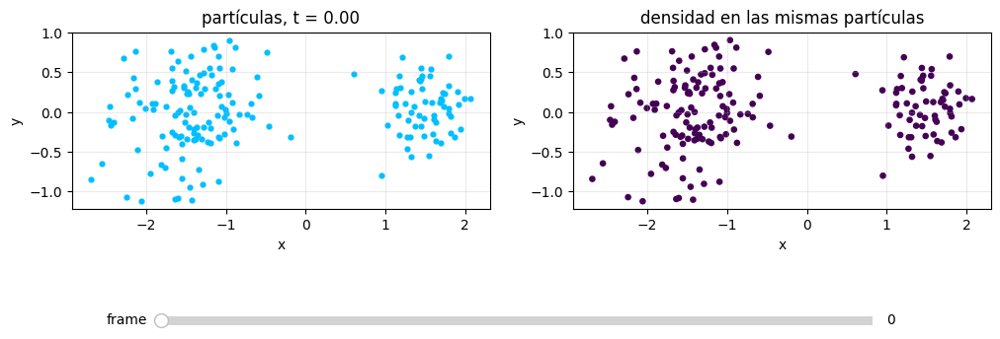

In [167]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))
plt.subplots_adjust(bottom=0.22)

ax_pos, ax_rho = axes
frame_inicial = 0

def dibujar_frame(frame):
    """Dibuja las posiciones y la densidad del instante seleccionado."""
    ax_pos.clear()
    ax_rho.clear()

    pos = historia['posiciones'][frame]
    rho = historia['rho'][frame]

    ax_pos.scatter(pos[:, 0], pos[:, 1], s=12, color='deepskyblue')
    ax_pos.set_title(f'partículas, t = {historia["tiempo"][frame]:.2f}')
    ax_pos.set_aspect('equal')
    ax_pos.set_xlabel('x')
    ax_pos.set_ylabel('y')

    imagen = ax_rho.scatter(pos[:, 0], pos[:, 1], s=14, c=rho, cmap='viridis',
                            vmin=historia['rho'].min(), vmax=historia['rho'].max())
    ax_rho.set_title('densidad en las mismas partículas')
    ax_rho.set_aspect('equal')
    ax_rho.set_xlabel('x')
    ax_rho.set_ylabel('y')
    return imagen


dibujar_frame(frame_inicial)
barra = plt.axes([0.20, 0.08, 0.60, 0.04])
slider = Slider(barra, 'frame', 0, len(historia['tiempo']) - 1,
                valinit=frame_inicial, valstep=1)

def actualizar(valor):
    """Redibuja la figura cuando cambia el slider."""
    dibujar_frame(int(slider.val))
    fig.canvas.draw_idle()


slider.on_changed(actualizar)
plt.show()

## 11. Animar la interacción

El slider permite inspeccionar un estado elegido. Ahora construiremos una animación para observar la evolución completa: la posición de las muestras, sus velocidades, la densidad y la presión.

La animación no vuelve a resolver Navier--Stokes. La simulación ya guardó esos campos en `historia`; cada cuadro solamente lee un estado y actualiza los gráficos. Esta separación evita repetir el cálculo físico durante la visualización. Si aumentamos mucho el número de muestras o de pasos, el cálculo del historial será la parte costosa; la animación seguirá usando los estados guardados.

In [ ]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation


# Usamos como máximo unos 60 cuadros para que la animación sea ligera.
salto = max(1, len(historia['tiempo']) // 60)
frames = np.arange(0, len(historia['tiempo']), salto)

posiciones_historia = historia['posiciones']
velocidades_historia = historia['velocidades']
densidades_historia = historia['rho']
presiones_historia = historia['presion']

# Límites comunes: la escala no cambia mientras las nubes se mueven.
posiciones_todas = posiciones_historia[:, :, :2].reshape(-1, 2)
x_min, y_min = posiciones_todas.min(axis=0) - 0.25
x_max, y_max = posiciones_todas.max(axis=0) + 0.25

rho_min = densidades_historia.min()
rho_max = densidades_historia.max()
presion_min = presiones_historia.min()
presion_max = presiones_historia.max()

fig, axes = plt.subplots(2, 2, figsize=(12, 9))
ax_pos, ax_vel = axes[0]
ax_rho, ax_presion = axes[1]

posicion_inicial = posiciones_historia[0]
velocidad_inicial = velocidades_historia[0]
rho_inicial = densidades_historia[0]
presion_inicial = presiones_historia[0]

# Posición: todas las muestras con el mismo color.
grafica_posicion = ax_pos.scatter(
    posicion_inicial[:, 0],
    posicion_inicial[:, 1],
    s=14,
    color='deepskyblue',
    edgecolors='black',
    linewidth=0.2,
)

# Velocidad: dibujamos una selección de flechas para no saturar la figura.
indices_velocidad = np.arange(
    0,
    len(posicion_inicial),
    max(1, len(posicion_inicial) // 45),
)
grafica_velocidad = ax_vel.quiver(
    posicion_inicial[indices_velocidad, 0],
    posicion_inicial[indices_velocidad, 1],
    velocidad_inicial[indices_velocidad, 0],
    velocidad_inicial[indices_velocidad, 1],
    color='tab:orange',
    angles='xy',
    scale_units='xy',
    scale=2.5,
    width=0.004,
)

grafica_rho = ax_rho.scatter(
    posicion_inicial[:, 0],
    posicion_inicial[:, 1],
    s=16,
    c=rho_inicial,
    cmap='viridis',
    vmin=rho_min,
    vmax=rho_max,
)
grafica_presion = ax_presion.scatter(
    posicion_inicial[:, 0],
    posicion_inicial[:, 1],
    s=16,
    c=presion_inicial,
    cmap='magma',
    vmin=presion_min,
    vmax=presion_max,
)

fig.colorbar(grafica_rho, ax=ax_rho, label='densidad')
fig.colorbar(grafica_presion, ax=ax_presion, label='presión')


def preparar_eje(axis, titulo):
    """Mantiene la misma escala espacial en todos los cuadros."""
    axis.set_xlim(x_min, x_max)
    axis.set_ylim(y_min, y_max)
    axis.set_aspect('equal')
    axis.set_xlabel('x')
    axis.set_ylabel('y')
    axis.set_title(titulo)


preparar_eje(ax_pos, 'posición de las muestras')
preparar_eje(ax_vel, 'velocidades')
preparar_eje(ax_rho, 'densidad')
preparar_eje(ax_presion, 'presión')



# La figura y los objetos gráficos quedan preparados para animarse.


In [168]:
# Ahora definimos cómo cambia cada objeto y construimos la animación.

def actualizar_animacion(frame):
    """Actualiza los cuatro campos para el estado temporal seleccionado."""
    pos = posiciones_historia[frame]
    vel = velocidades_historia[frame]

    grafica_posicion.set_offsets(pos[:, :2])
    grafica_velocidad.set_offsets(pos[indices_velocidad, :2])
    grafica_velocidad.set_UVC(
        vel[indices_velocidad, 0],
        vel[indices_velocidad, 1],
    )
    grafica_rho.set_offsets(pos[:, :2])
    grafica_rho.set_array(densidades_historia[frame])
    grafica_presion.set_offsets(pos[:, :2])
    grafica_presion.set_array(presiones_historia[frame])
    fig.suptitle(
        f'interacción SPH, t = {historia["tiempo"][frame]:.2f}',
        fontsize=16,
    )


animacion = FuncAnimation(
    fig,
    actualizar_animacion,
    frames=frames,
    interval=80,
    repeat=True,
)
plt.tight_layout()

# HTML permite reproducirla dentro del notebook sin abrir otra ventana.
html_animacion = animacion.to_jshtml(fps=12)
plt.close(fig)
HTML(html_animacion)

## Retos de comprobación

### Reto 2 — separar los mecanismos

Usa `simular` durante pocos pasos con gravedad desactivada y compara el desplazamiento con el caso completo. Después repite desactivando presión y viscosidad. No basta con decir “la gravedad atrae”: guarda las dos historias y grafica sus posiciones finales.

¿Qué mecanismo produce principalmente la aproximación entre las nubes? ¿Qué mecanismo modifica la respuesta cuando las partículas se comprimen?

In [169]:
# Reto 2: completa dos simulaciones cortas y compara sus posiciones finales.
# Mantén pocos pasos para que el experimento sea rápido.
n_reto = 25

<details>
<summary>Respuesta sugerida del Reto 2</summary>

```python
hist_sin_gravedad = simular(
    posiciones_0, velocidades_0, masas,
    n_pasos=n_reto, mostrar_progreso=False,
    usar_gravedad=False
)

hist_solo_gravedad = simular(
    posiciones_0, velocidades_0, masas,
    n_pasos=n_reto, mostrar_progreso=False,
    usar_presion=False, usar_viscosidad=False
)

fig, ax = plt.subplots()
ax.scatter(hist_sin_gravedad['posiciones'][-1][:, 0],
           hist_sin_gravedad['posiciones'][-1][:, 1],
           s=10, label='sin gravedad')
ax.scatter(hist_solo_gravedad['posiciones'][-1][:, 0],
           hist_solo_gravedad['posiciones'][-1][:, 1],
           s=10, label='solo gravedad')
ax.set_aspect('equal')
ax.legend()
plt.show()
```

La comparación no aísla una “fuerza verdadera” de manera perfecta, porque cambiar un término también cambia la trayectoria posterior. Sí permite observar qué parte del modelo es responsable de cada efecto dominante.
</details>

### Reto 3 — observar el papel de la viscosidad artificial

Repite una simulación corta con `alpha=0` y `beta=0` dentro de `aceleracion_viscosidad`, o crea una versión de `aceleracion_total` que no sume ese término. Compara la velocidad máxima y la separación de las nubes.

La interpretación esperada no es que “la viscosidad empuje” siempre en una dirección. Su papel aparece cuando hay partículas acercándose: amortigua cambios bruscos y modifica la respuesta durante la compresión.

<details>
<summary>Respuesta sugerida del Reto 3</summary>

```python
hist_con_viscosidad = simular(
    posiciones_0, velocidades_0, masas,
    n_pasos=25, mostrar_progreso=False
)

hist_sin_viscosidad = simular(
    posiciones_0, velocidades_0, masas,
    n_pasos=25, mostrar_progreso=False,
    alpha=0.0, beta=0.0
)

vel_con_visc = np.linalg.norm(
    hist_con_viscosidad['velocidades'][-1],
    axis=1,
).max()
vel_sin_visc = np.linalg.norm(hist_sin_viscosidad['velocidades'][-1], axis=1).max()
print('velocidad máxima con viscosidad:', vel_con_visc)
print('velocidad máxima sin viscosidad:', vel_sin_visc)
```

La comparación debe hacerse con el mismo número de pasos y las mismas condiciones iniciales. La viscosidad artificial no elimina la dinámica: modifica especialmente las fases en que las partículas se aproximan.
</details>

## Límites del modelo que acabamos de usar

- Las posiciones son partículas 3D, pero las figuras son proyecciones 2D.
- La suma de vecinas es directa y escala como $N^2$; por eso usamos pocas partículas.
- $h$ se adapta mediante una iteración sencilla. Las formulaciones completas añaden correcciones asociadas a $\nabla h$.
- La presión se obtiene de $p=K\rho^\gamma$ sin resolver una ecuación de energía.
- La viscosidad usada es artificial y numérica; no debe confundirse con una propiedad material medida.
- No hay paredes ni una superficie libre impuesta. Las nubes están en un dominio abierto y su evolución está gobernada por las fuerzas programadas.

Estos límites no invalidan el experimento. Delimitan qué pregunta responde: **cómo construir y visualizar una interacción hidrodinámica sencilla a partir de sumas locales sobre partículas**.